In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("karanwxlia/underwater-trash-detection")

print("Path to dataset files:", path)


100%|██████████| 213M/213M [00:03<00:00, 58.5MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1


In [2]:

import os

dataset_path = "/root/.cache/kagglehub/datasets/karanwxlia/underwater-trash-detection/versions/1"
print(os.listdir(dataset_path))

yolo_path = os.path.join(dataset_path, "utd2.v8i.yolov8")
print(os.listdir(yolo_path))


['utd2.v8i.yolov8', 'utd2.v8i.tensorflow', 'utd2.v8i.coco']
['test', 'train', 'README.dataset.txt', 'valid', 'README.roboflow.txt', 'data.yaml']


In [3]:
import os
import shutil
import glob

# Define paths
all_images_path = "/kaggle/working/all_images"
all_labels_path = "/kaggle/working/all_labels"
os.makedirs(all_images_path, exist_ok=True)
os.makedirs(all_labels_path, exist_ok=True)

# Move images and labels from train, valid, and test to all_images & all_labels
for split in ["train", "valid", "test"]:
    split_images = os.path.join(yolo_path, split, "images")
    split_labels = os.path.join(yolo_path, split, "labels")

    for img in glob.glob(os.path.join(split_images, "*.jpg")):  # Adjust extension if needed
        shutil.move(img, all_images_path)

    for lbl in glob.glob(os.path.join(split_labels, "*.txt")):
        shutil.move(lbl, all_labels_path)

print("Merged all images and labels into all_images/ and all_labels/.")


Merged all images and labels into all_images/ and all_labels/.


In [4]:
import random

# Get all images
all_images = sorted(glob.glob(os.path.join(all_images_path, "*.jpg")))
random.shuffle(all_images)

# Define split
split_idx = int(0.7 * len(all_images))
train_images, test_images = all_images[:split_idx], all_images[split_idx:]

# Create new train/test folders
train_path = "/kaggle/working/train"
test_path = "/kaggle/working/test"
os.makedirs(os.path.join(train_path, "images"), exist_ok=True)
os.makedirs(os.path.join(test_path, "images"), exist_ok=True)
os.makedirs(os.path.join(train_path, "labels"), exist_ok=True)
os.makedirs(os.path.join(test_path, "labels"), exist_ok=True)

# Move images & labels
for img in train_images:
    shutil.move(img, os.path.join(train_path, "images"))
    lbl = img.replace("all_images", "all_labels").replace(".jpg", ".txt")
    if os.path.exists(lbl):
        shutil.move(lbl, os.path.join(train_path, "labels"))

for img in test_images:
    shutil.move(img, os.path.join(test_path, "images"))
    lbl = img.replace("all_images", "all_labels").replace(".jpg", ".txt")
    if os.path.exists(lbl):
        shutil.move(lbl, os.path.join(test_path, "labels"))

print(f"Train: {len(train_images)} images, Test: {len(test_images)} images")

Train: 6703 images, Test: 2873 images


In [5]:
! pip install ultralytics opencv-python matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 28.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 66.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 53.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 35.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 73.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [6]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n.pt")
model.train(data="/content/data.yml", epochs = 25, imgsz=640)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 95.0MB/s]


Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/data.yml, epochs=25, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, li

100%|██████████| 755k/755k [00:00<00:00, 23.4MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/working/train/labels... 6703 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6703/6703 [00:04<00:00, 1524.19it/s]

train: WARNING ⚠️ /kaggle/working/train/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed


train: New cache created: /kaggle/working/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/test/labels... 2873 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2873/2873 [00:02<00:00, 1205.44it/s]

val: New cache created: /kaggle/working/test/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      2.44G      1.513      2.715      1.621         43        640: 100%|██████████| 419/419 [02:04<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:25<00:00,  3.53it/s]


                   all       2873       4302      0.293      0.263      0.187     0.0904

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      2.87G      1.587      2.188      1.676         37        640: 100%|██████████| 419/419 [02:03<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.79it/s]


                   all       2873       4302      0.432      0.381      0.339      0.173

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      2.87G      1.586      2.061      1.689         36        640: 100%|██████████| 419/419 [01:57<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.76it/s]


                   all       2873       4302      0.423      0.306      0.305      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      2.88G      1.555      1.944      1.669         34        640: 100%|██████████| 419/419 [01:55<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.76it/s]


                   all       2873       4302      0.517      0.394      0.405      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      2.89G      1.502      1.803      1.617         53        640: 100%|██████████| 419/419 [01:56<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.77it/s]


                   all       2873       4302      0.596      0.494      0.524      0.297

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      2.91G      1.459       1.71      1.584         37        640: 100%|██████████| 419/419 [01:55<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.77it/s]


                   all       2873       4302      0.598      0.517       0.55      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      2.93G      1.435       1.63      1.577         50        640: 100%|██████████| 419/419 [01:55<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.71it/s]


                   all       2873       4302      0.638      0.499      0.557      0.333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      2.94G      1.415      1.594      1.556         48        640: 100%|██████████| 419/419 [01:55<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:22<00:00,  3.98it/s]


                   all       2873       4302      0.509      0.353      0.373      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      2.95G      1.392      1.507      1.536         45        640: 100%|██████████| 419/419 [01:55<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.81it/s]


                   all       2873       4302      0.672      0.573      0.628       0.39

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      2.97G      1.364      1.456      1.517         56        640: 100%|██████████| 419/419 [01:56<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.77it/s]


                   all       2873       4302      0.696      0.575      0.653      0.393

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      2.98G      1.344       1.41      1.495         37        640: 100%|██████████| 419/419 [01:55<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.78it/s]


                   all       2873       4302      0.749      0.633      0.733      0.468

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      2.99G      1.327      1.355       1.48         34        640: 100%|██████████| 419/419 [01:56<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.80it/s]


                   all       2873       4302      0.753      0.666      0.732       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      3.01G      1.304      1.307      1.464         48        640: 100%|██████████| 419/419 [01:56<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.78it/s]

                   all       2873       4302      0.776      0.644      0.744      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      3.02G       1.28      1.269      1.452         28        640: 100%|██████████| 419/419 [01:55<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.74it/s]


                   all       2873       4302       0.82      0.686      0.787      0.522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      3.04G      1.281      1.237      1.444         56        640: 100%|██████████| 419/419 [02:00<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.80it/s]

                   all       2873       4302      0.792      0.709      0.792      0.535


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      3.05G      1.256      1.053      1.479         22        640: 100%|██████████| 419/419 [01:53<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.75it/s]


                   all       2873       4302      0.804       0.73      0.808      0.551

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      3.07G      1.232     0.9892      1.465         19        640: 100%|██████████| 419/419 [01:49<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.80it/s]


                   all       2873       4302      0.821      0.761      0.832      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      3.09G      1.206     0.9422      1.433         18        640: 100%|██████████| 419/419 [01:49<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.78it/s]

                   all       2873       4302      0.831      0.748      0.831      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25       3.1G      1.177     0.8858      1.414         20        640: 100%|██████████| 419/419 [01:48<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.85it/s]


                   all       2873       4302      0.852      0.758      0.842      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      3.11G      1.149     0.8447      1.393         17        640: 100%|██████████| 419/419 [01:49<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.87it/s]


                   all       2873       4302      0.861      0.798      0.867      0.614

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      3.13G       1.13     0.8143      1.379         16        640: 100%|██████████| 419/419 [01:50<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:24<00:00,  3.75it/s]

                   all       2873       4302      0.855      0.793      0.867      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      3.14G      1.105      0.781      1.357         20        640: 100%|██████████| 419/419 [01:50<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.79it/s]

                   all       2873       4302      0.868       0.79      0.872      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      3.16G      1.086     0.7401      1.334         35        640: 100%|██████████| 419/419 [01:51<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.80it/s]


                   all       2873       4302      0.871      0.807      0.884      0.643

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      3.17G      1.067      0.712       1.32         19        640: 100%|██████████| 419/419 [01:49<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.76it/s]


                   all       2873       4302      0.884      0.815       0.89      0.648

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      3.19G      1.052     0.6998      1.316         17        640: 100%|██████████| 419/419 [01:51<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:23<00:00,  3.80it/s]

                   all       2873       4302      0.874      0.819      0.889      0.654



25 epochs completed in 0.966 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 90/90 [00:25<00:00,  3.48it/s]


                   all       2873       4302      0.875      0.818      0.889      0.654
                   Bio        664        907      0.863      0.818      0.888      0.671
                   Rov        452        596      0.839      0.833      0.882      0.704
                 Trash       2236       2799      0.924      0.803      0.898      0.587
Speed: 0.3ms preprocess, 2.2ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f2104275910>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

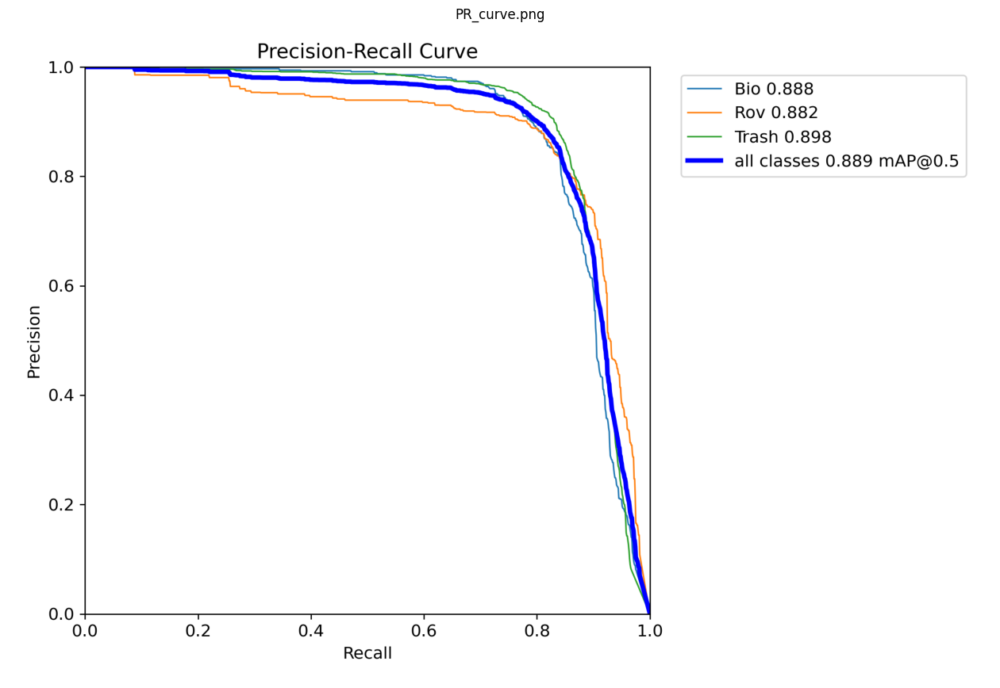

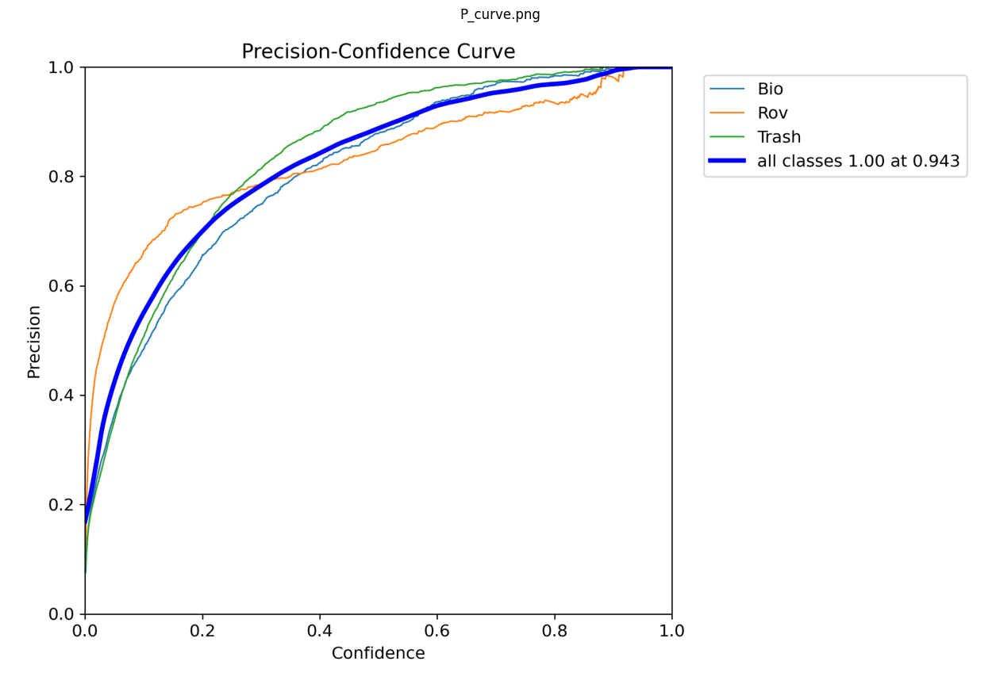

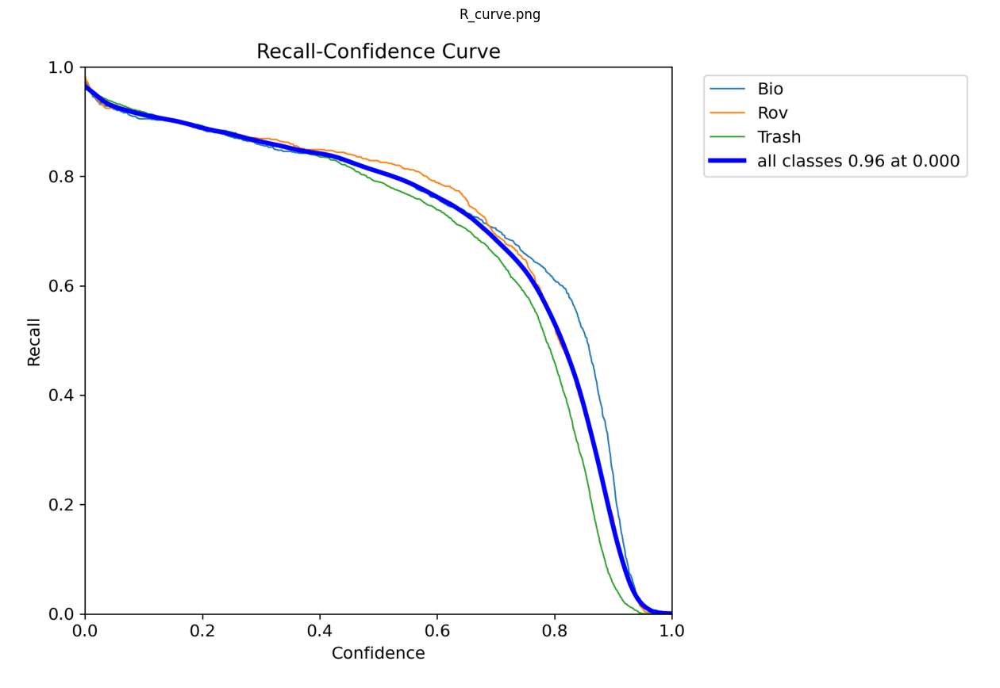

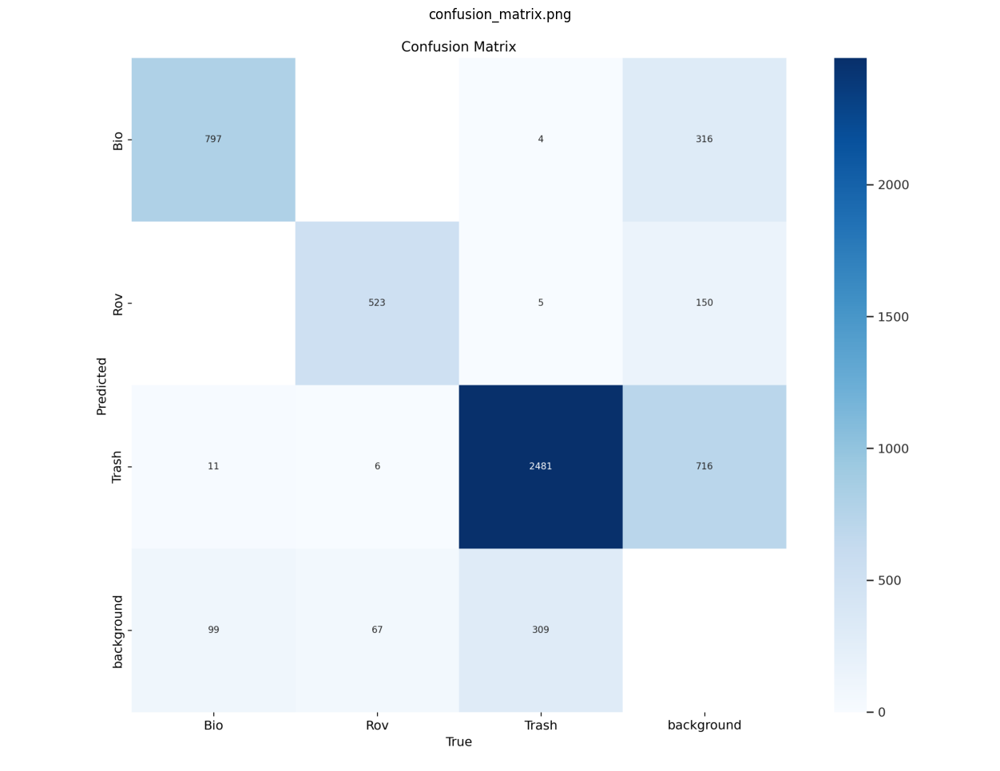

In [10]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

list_of_metrics = ["PR_curve.png","P_curve.png", "R_curve.png", "confusion_matrix.png"]

for i in list_of_metrics:
    img_path = f"/content/runs/detect/train/{i}"

    # Read the image
    img = cv2.imread(img_path)

    if img is not None:
        # Convert BGR to RGB (for proper visualization)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Display the image
        plt.figure(figsize=(16, 12))
        plt.imshow(img)
        plt.axis("off")  # Hide axes
        plt.title(i)  # Set title
        plt.show()
    else:
        print(f"⚠️ Error: {i} not found at {img_path}")


In [11]:
import pandas as pd
results = pd.read_csv("/content/runs/detect/train/results.csv")
results.head()

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,155.644,1.51348,2.71491,1.62118,0.29253,0.26347,0.18696,0.09043,1.77045,2.74674,1.95665,0.000475,0.000475,0.000475
1,2,303.405,1.58656,2.18785,1.67582,0.43193,0.38072,0.33889,0.17297,1.74179,2.01002,1.87246,0.000914,0.000914,0.000914
2,3,444.969,1.58638,2.06071,1.68897,0.42324,0.30634,0.30480,0.15652,1.90417,2.34346,2.02834,0.001315,0.001315,0.001315
3,4,584.839,1.55532,1.94354,1.66911,0.51695,0.39376,0.40494,0.21525,1.75720,1.96510,1.93135,0.001259,0.001259,0.001259
4,5,726.054,1.50232,1.80324,1.61667,0.59560,0.49356,0.52376,0.29655,1.58575,1.64456,1.73651,0.001203,0.001203,0.001203


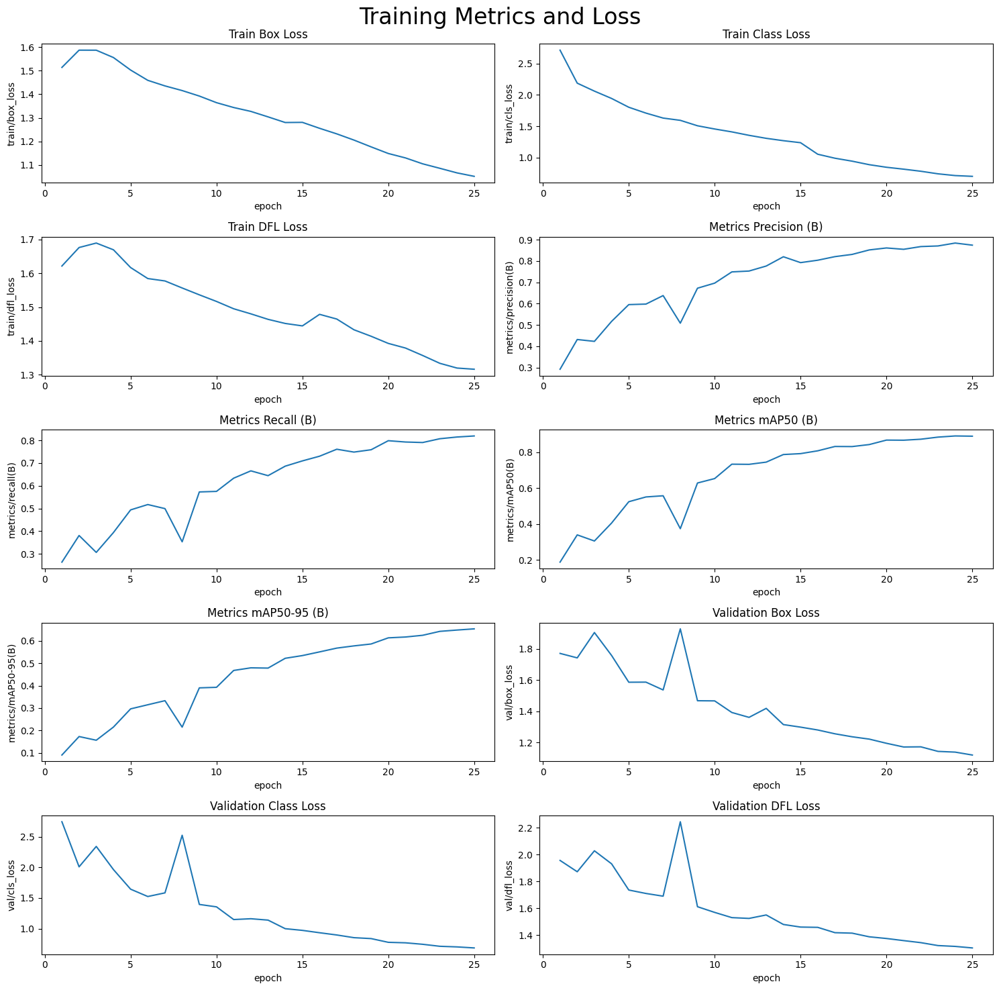

In [12]:
import seaborn as sns
results.columns = results.columns.str.strip()
# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=results, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=results, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=results, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=results, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=results, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=results, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=results, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=results, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=results, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=results, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

In [13]:
# Loading the best performing model
Valid_model = YOLO('/content/runs/detect/train/weights/best.pt')

# Evaluating the model on the testset
metrics = Valid_model.val(split = 'test')

Ultralytics 8.3.96 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /kaggle/working/test/labels.cache... 2873 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2873/2873 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 180/180 [00:31<00:00,  5.64it/s]


                   all       2873       4302      0.875      0.817      0.889      0.654
                   Bio        664        907      0.863      0.817      0.889      0.672
                   Rov        452        596      0.839      0.832      0.882      0.704
                 Trash       2236       2799      0.922      0.803      0.897      0.587
Speed: 0.9ms preprocess, 3.9ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/val


In [14]:
# final results
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

precision(B):  0.8746719817009948
metrics/recall(B):  0.8174211611302543
metrics/mAP50(B):  0.889208895919428
metrics/mAP50-95(B):  0.6541809178184209


In [15]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')


image 1/1 /kaggle/working/test/images/bio0004_frame0000241_jpg.rf.a9f046ea342287ae16c1ee918a013d87.jpg: 640x640 1 Bio, 13.6ms
Speed: 2.7ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


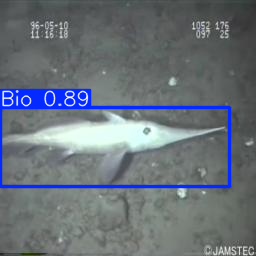


image 1/1 /kaggle/working/test/images/obj1505_frame0000115_jpg.rf.7eee4de4195d192d838a5553613a4ca4.jpg: 640x640 1 Trash, 13.5ms
Speed: 3.4ms preprocess, 13.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


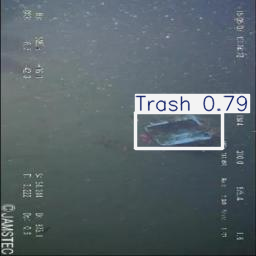


image 1/1 /kaggle/working/test/images/plastic22_jpg.rf.6e4fe9458e3ab3691de34b6015cbd46e.jpg: 640x640 1 Bio, 1 Trash, 13.0ms
Speed: 4.3ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


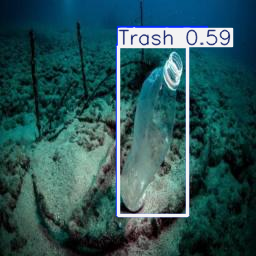


image 1/1 /kaggle/working/test/images/obj0007_frame0000029_jpg.rf.513e90264179a052038b5e8ae2635407.jpg: 640x640 1 Trash, 15.2ms
Speed: 3.2ms preprocess, 15.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


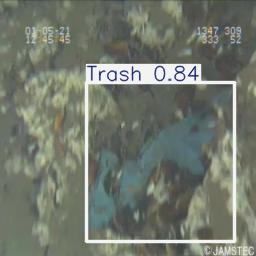


image 1/1 /kaggle/working/test/images/FishDataset111_png_jpg.rf.3ece43460a1eafc9da2213a8c68edf82.jpg: 640x640 4 Bios, 11.6ms
Speed: 3.4ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


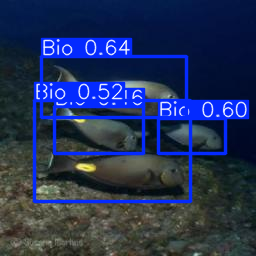


image 1/1 /kaggle/working/test/images/obj1284_frame0000115_jpg.rf.6a175a810123de37dceefb2604b5af06.jpg: 640x640 1 Rov, 1 Trash, 13.0ms
Speed: 5.2ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


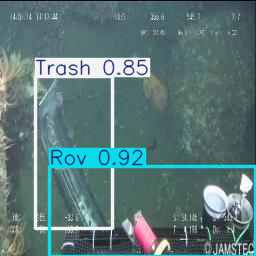


image 1/1 /kaggle/working/test/images/plastic8_jpg.rf.01c7cd2a6818bfc36b802f7004d94fcb.jpg: 640x640 1 Trash, 12.0ms
Speed: 3.3ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


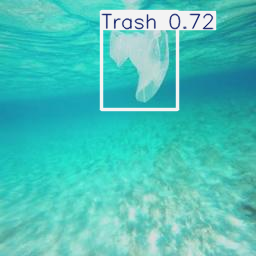


image 1/1 /kaggle/working/test/images/vid_000550_frame0000026_jpg.rf.1c686b70a07d71a9079063155b8e6c28.jpg: 640x640 1 Trash, 13.2ms
Speed: 3.6ms preprocess, 13.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


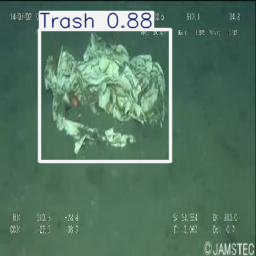


image 1/1 /kaggle/working/test/images/obj0332_frame0000056_jpg.rf.3ad26a54b870b77c3f4c3246c4b2bf9d.jpg: 640x640 1 Trash, 18.9ms
Speed: 3.6ms preprocess, 18.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


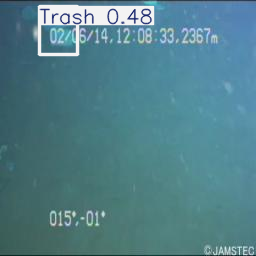


image 1/1 /kaggle/working/test/images/vid_000123_frame0000029_jpg.rf.4fb4ebcbf8d6325200c17b17f5cb1484.jpg: 640x640 1 Trash, 22.4ms
Speed: 3.8ms preprocess, 22.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


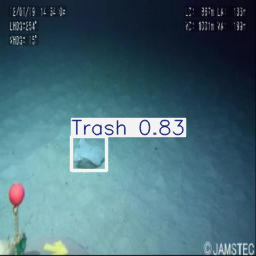


image 1/1 /kaggle/working/test/images/obj1656_frame0000578_jpg.rf.170e9a42c96552a10e20063547618c95.jpg: 640x640 1 Trash, 16.5ms
Speed: 3.6ms preprocess, 16.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


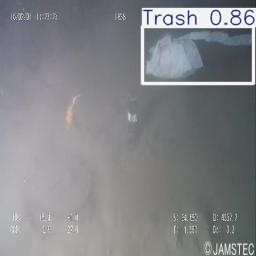


image 1/1 /kaggle/working/test/images/obj0750_frame0000052_jpg.rf.689c7286e691f5437a9097316ed49e69.jpg: 640x640 1 Trash, 12.7ms
Speed: 3.8ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


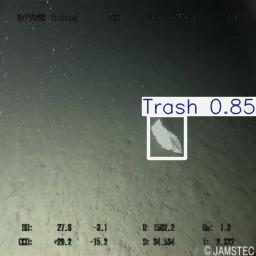


image 1/1 /kaggle/working/test/images/obj0310_frame0000030_jpg.rf.857a3ee5907abbc7967003b33fd80ec1.jpg: 640x640 1 Rov, 13.3ms
Speed: 3.3ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


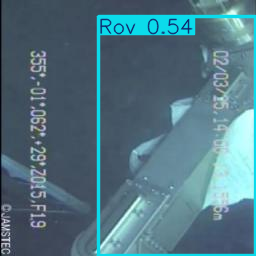


image 1/1 /kaggle/working/test/images/obj1061_frame0000109_jpg.rf.3c963f33085909a3c8e2f8a6c4caf58c.jpg: 640x640 1 Trash, 16.2ms
Speed: 3.3ms preprocess, 16.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


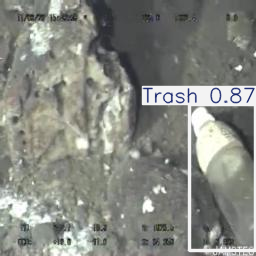


image 1/1 /kaggle/working/test/images/obj0331_frame0000017_jpg.rf.a61edb2104a84be00d42b73a7479a39b.jpg: 640x640 1 Trash, 14.0ms
Speed: 3.4ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


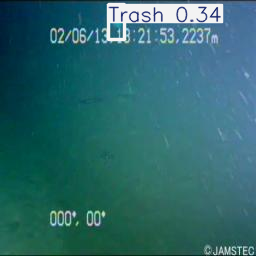


image 1/1 /kaggle/working/test/images/bio0016_frame0000187_jpg.rf.971ddcc2bb692e826bf57c5d737c6f37.jpg: 640x640 1 Bio, 23.3ms
Speed: 4.9ms preprocess, 23.3ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


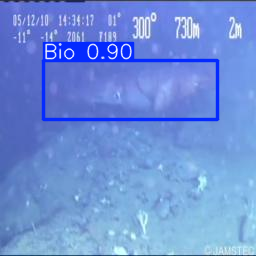


image 1/1 /kaggle/working/test/images/obj1073_frame0000026_jpg.rf.a357ba6492cdc7e905bb4be1e0054179.jpg: 640x640 1 Bio, 1 Trash, 20.2ms
Speed: 3.7ms preprocess, 20.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


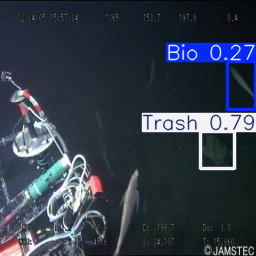


image 1/1 /kaggle/working/test/images/frame_01800_png_jpg.rf.711f517adbe90259379a00177347cc41.jpg: 640x640 1 Trash, 16.6ms
Speed: 3.7ms preprocess, 16.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


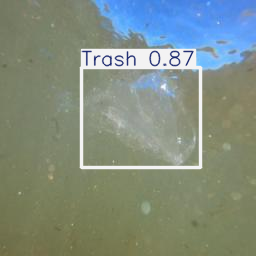


image 1/1 /kaggle/working/test/images/obj0319_frame0000016_jpg.rf.6a582043849a3440c1c60ee2a913f658.jpg: 640x640 1 Trash, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


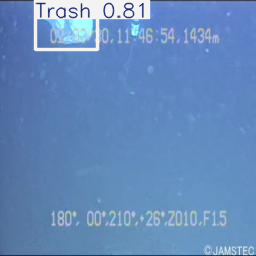


image 1/1 /kaggle/working/test/images/vid_000255_frame0000034_jpg.rf.e5b1f6eb37e382f745297fbac4d119de.jpg: 640x640 1 Trash, 12.4ms
Speed: 3.5ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


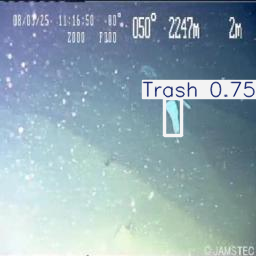


image 1/1 /kaggle/working/test/images/obj0871_frame0000098_jpg.rf.0960737da0dafa456ebafcb3824a0062.jpg: 640x640 1 Trash, 12.8ms
Speed: 3.5ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


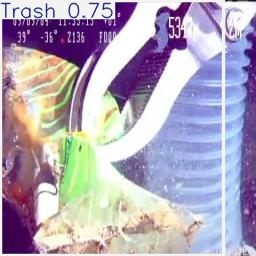


image 1/1 /kaggle/working/test/images/obj0707_frame0000008_jpg.rf.564a9b1d5b2b4be1d5c0dc765107f0f7.jpg: 640x640 1 Rov, 13.8ms
Speed: 6.6ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


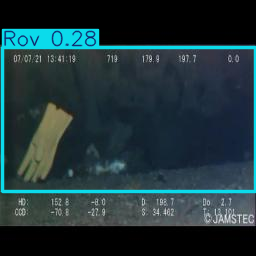


image 1/1 /kaggle/working/test/images/obj0340_frame0000009_jpg.rf.4c9a5658149e0b81507030781c526cf7.jpg: 640x640 1 Rov, 1 Trash, 13.1ms
Speed: 5.7ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


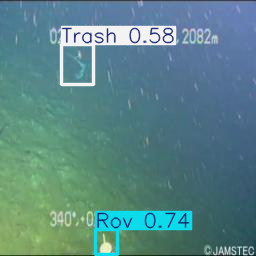


image 1/1 /kaggle/working/test/images/obj1658_frame0000517_jpg.rf.186aae6c63329fa21cd5a278e9acdfe2.jpg: 640x640 1 Rov, 1 Trash, 12.2ms
Speed: 3.5ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


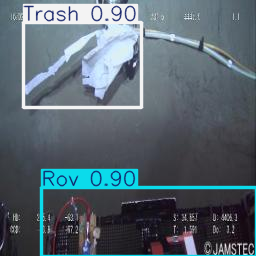


image 1/1 /kaggle/working/test/images/obj0343_frame0000027_jpg.rf.8c9acee7816913f36596dfeef71729ad.jpg: 640x640 2 Trashs, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


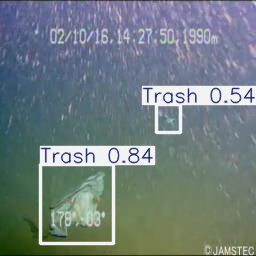


image 1/1 /kaggle/working/test/images/obj1655_frame0000213_jpg.rf.07036ad076141199e8d86f7bca388fc5.jpg: 640x640 1 Trash, 12.7ms
Speed: 4.0ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


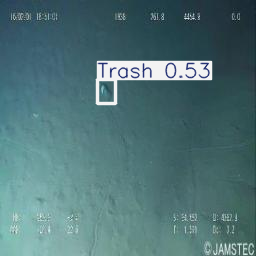


image 1/1 /kaggle/working/test/images/frame_00025_png_jpg.rf.1ebd49eb2490dc629d7e60dcc3b6f9c9.jpg: 640x640 1 Trash, 12.5ms
Speed: 3.5ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


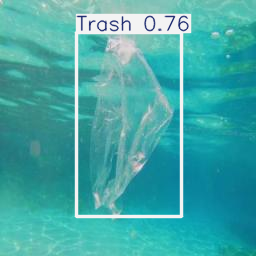


image 1/1 /kaggle/working/test/images/obj1648_frame0000279_jpg.rf.dc1a86717d5f1ecfa43b84a07c58268d.jpg: 640x640 1 Trash, 12.2ms
Speed: 3.2ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


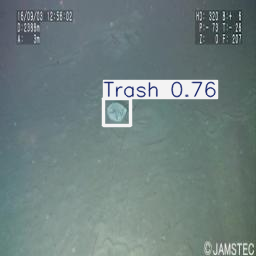


image 1/1 /kaggle/working/test/images/frame_00900_png_jpg.rf.512c26e46ae8047fd7876f8de841d2d5.jpg: 640x640 (no detections), 13.0ms
Speed: 3.2ms preprocess, 13.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


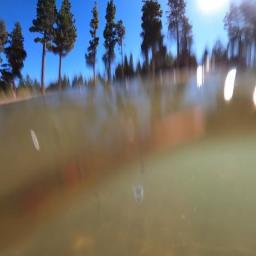


image 1/1 /kaggle/working/test/images/vid_000085_frame0000015_jpg.rf.92e2cfd29297f7cca5aee949512e27c4.jpg: 640x640 1 Trash, 12.8ms
Speed: 3.4ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


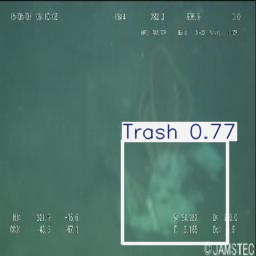


image 1/1 /kaggle/working/test/images/frame_01470_png_jpg.rf.383634af375ee4babdac1fc342f68c39.jpg: 640x640 (no detections), 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


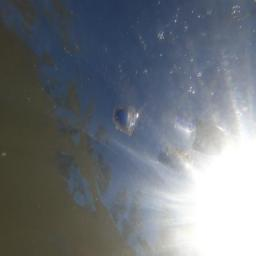


image 1/1 /kaggle/working/test/images/vid_000241_frame0000014_jpg.rf.76339477593e61664c5dde8fabb98dc7.jpg: 640x640 1 Trash, 12.2ms
Speed: 3.3ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


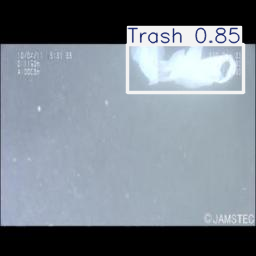


image 1/1 /kaggle/working/test/images/obj0319_frame0000013_jpg.rf.2e0425413b368628a98538910cc897b6.jpg: 640x640 1 Trash, 12.0ms
Speed: 3.4ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


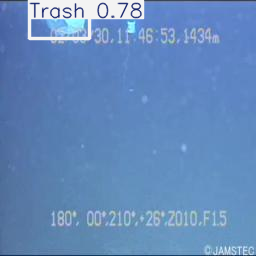


image 1/1 /kaggle/working/test/images/vid_000080_frame0000045_jpg.rf.66864102e472d8cd18b0f593e70fc4a4.jpg: 640x640 1 Trash, 12.4ms
Speed: 3.4ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


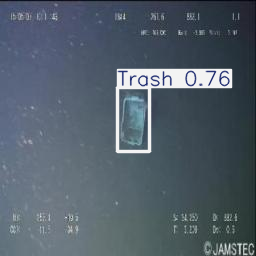


image 1/1 /kaggle/working/test/images/bio0012_frame0000455_jpg.rf.daab4f5e989880185fae522bdd08bf16.jpg: 640x640 1 Bio, 12.9ms
Speed: 3.3ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


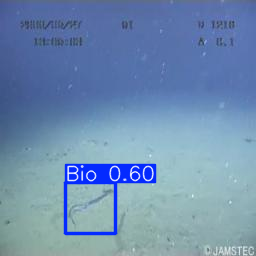


image 1/1 /kaggle/working/test/images/obj0314_frame0000029_jpg.rf.220e2c5658cca042a27e74cc3cfc6c92.jpg: 640x640 1 Trash, 16.5ms
Speed: 3.8ms preprocess, 16.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


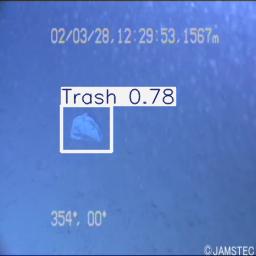


image 1/1 /kaggle/working/test/images/obj0007_frame0000046_jpg.rf.fd1a89ba38ebad9d477d734e740d0759.jpg: 640x640 1 Rov, 1 Trash, 19.0ms
Speed: 3.7ms preprocess, 19.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


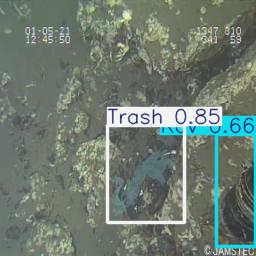


image 1/1 /kaggle/working/test/images/10_jpg.rf.c76254d04296c94f71ea093a00e3d7a6.jpg: 640x640 1 Trash, 12.5ms
Speed: 3.3ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


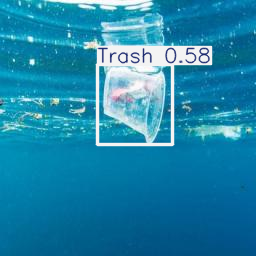


image 1/1 /kaggle/working/test/images/obj1617_frame0000188_jpg.rf.0579361d7d96bd630a7806a57a383381.jpg: 640x640 2 Rovs, 1 Trash, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


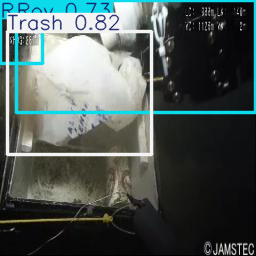


image 1/1 /kaggle/working/test/images/25_jpg.rf.e29901d4d1c44088e41cb38fa3f6ff67.jpg: 640x640 2 Trashs, 12.6ms
Speed: 3.2ms preprocess, 12.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


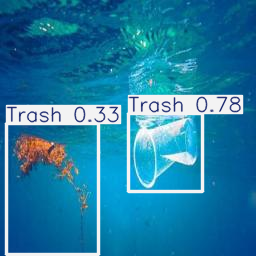


image 1/1 /kaggle/working/test/images/obj1107_frame0000027_jpg.rf.c7c07193c2fa1513a52e2d0971eb2c4c.jpg: 640x640 1 Trash, 15.0ms
Speed: 4.2ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


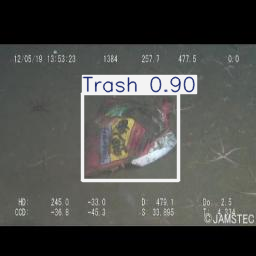


image 1/1 /kaggle/working/test/images/obj1033_frame0000010_jpg.rf.68a2375507fa091b232f932639d2efd9.jpg: 640x640 1 Trash, 14.2ms
Speed: 5.4ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


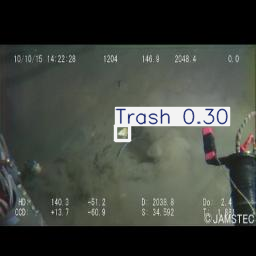


image 1/1 /kaggle/working/test/images/frame_00650_png_jpg.rf.9e88c4b4c71913319970575720ee7429.jpg: 640x640 1 Trash, 17.0ms
Speed: 3.2ms preprocess, 17.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


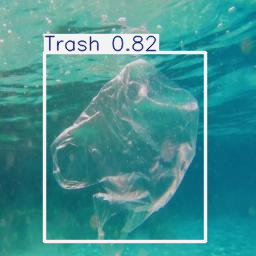


image 1/1 /kaggle/working/test/images/obj0228_frame0000037_jpg.rf.24a87df30362dca3d99fdf978420bbc3.jpg: 640x640 1 Trash, 16.2ms
Speed: 3.4ms preprocess, 16.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


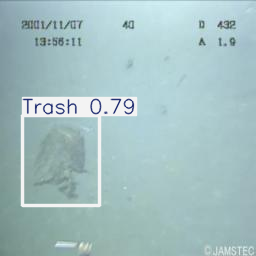


image 1/1 /kaggle/working/test/images/bio0015_frame0000054_jpg.rf.2b35e46fc0f767da21d34445192cd2a1.jpg: 640x640 2 Bios, 2 Rovs, 15.2ms
Speed: 3.8ms preprocess, 15.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


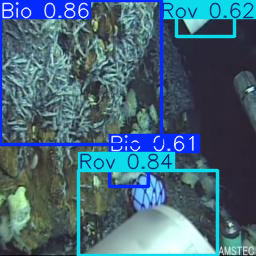


image 1/1 /kaggle/working/test/images/obj0333_frame0000055_jpg.rf.1677c1c715ddf44b733ab24f063582a7.jpg: 640x640 1 Trash, 15.8ms
Speed: 4.9ms preprocess, 15.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


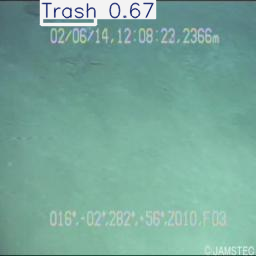


image 1/1 /kaggle/working/test/images/obj0856_frame0000024_jpg.rf.3c58512028ebf3c952c0003c0a8840c3.jpg: 640x640 1 Trash, 15.0ms
Speed: 4.1ms preprocess, 15.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


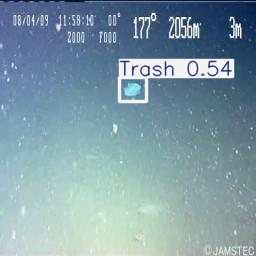


image 1/1 /kaggle/working/test/images/bio0014_frame0000224_jpg.rf.550dd537afd1b948fbc6ec827c69fb3f.jpg: 640x640 1 Bio, 13.1ms
Speed: 6.6ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


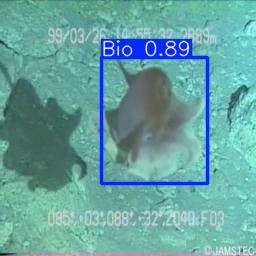


image 1/1 /kaggle/working/test/images/obj1030_frame0000005_jpg.rf.1b434494caaea07afa52aa1fa5c895ce.jpg: 640x640 (no detections), 14.1ms
Speed: 3.4ms preprocess, 14.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


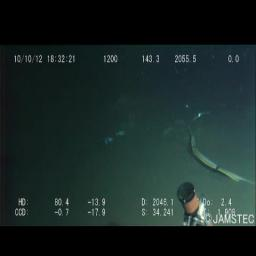


image 1/1 /kaggle/working/test/images/obj1658_frame0000126_jpg.rf.7377403ee6a961f5822cd531456ba6b8.jpg: 640x640 1 Trash, 11.7ms
Speed: 3.6ms preprocess, 11.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


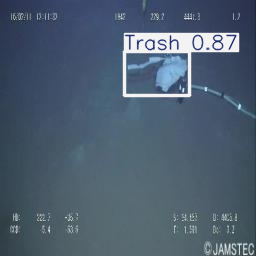


image 1/1 /kaggle/working/test/images/vid_000304_frame0000026_jpg.rf.3f3dee610848ba95788d32eb1f38a86c.jpg: 640x640 1 Trash, 13.2ms
Speed: 5.8ms preprocess, 13.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


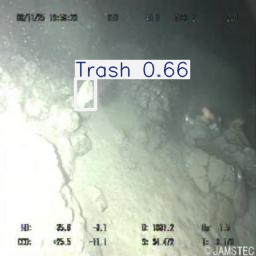


image 1/1 /kaggle/working/test/images/obj1297_frame0000092_jpg.rf.61d310547a741d7d5672ea23c8bf8bf1.jpg: 640x640 1 Rov, 1 Trash, 12.6ms
Speed: 3.4ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


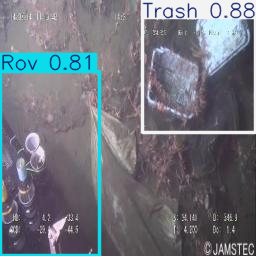


image 1/1 /kaggle/working/test/images/bio0014_frame0000168_jpg.rf.0c717c1c278d6587d3c8e693312c5310.jpg: 640x640 1 Bio, 12.9ms
Speed: 3.4ms preprocess, 12.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


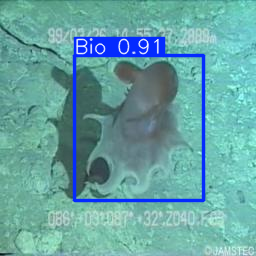


image 1/1 /kaggle/working/test/images/obj1616_frame0000015_jpg.rf.3b3230ccbe4764dbd060896781474414.jpg: 640x640 1 Rov, 1 Trash, 13.7ms
Speed: 3.9ms preprocess, 13.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


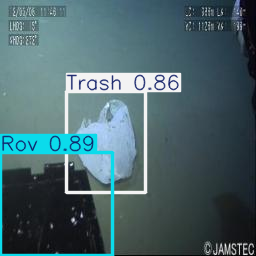


image 1/1 /kaggle/working/test/images/bio0017_frame0000397_jpg.rf.33a819d392589bf21fb1df963c80e241.jpg: 640x640 1 Bio, 12.3ms
Speed: 3.6ms preprocess, 12.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


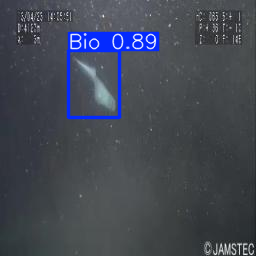


image 1/1 /kaggle/working/test/images/bio0000_frame0000282_jpg.rf.24efb11261ec04f3902947aca749a188.jpg: 640x640 1 Bio, 14.5ms
Speed: 3.4ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


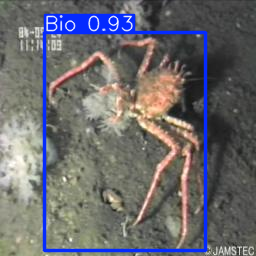


image 1/1 /kaggle/working/test/images/vid_000170_frame0000006_jpg.rf.459137c7dc57fe47da2c6d417e3b95bf.jpg: 640x640 1 Trash, 13.1ms
Speed: 3.9ms preprocess, 13.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


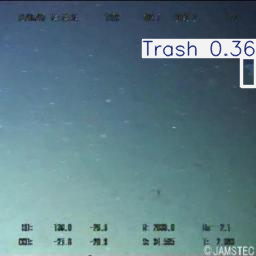


image 1/1 /kaggle/working/test/images/obj0201_frame0000001_jpg.rf.2e8bc4a9ada4c67d4cc5a73797d17ae4.jpg: 640x640 1 Trash, 12.1ms
Speed: 3.4ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


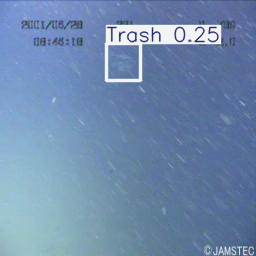


image 1/1 /kaggle/working/test/images/obj1648_frame0000336_jpg.rf.452effc5d775ccaccd4813da6a3601d1.jpg: 640x640 1 Trash, 12.4ms
Speed: 3.7ms preprocess, 12.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


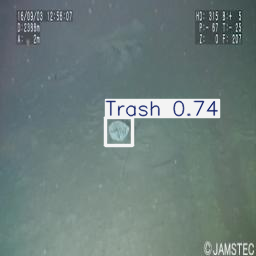


image 1/1 /kaggle/working/test/images/vid_000532_frame0000120_jpg.rf.d19e609e5d0f3385d593918c4d776d7f.jpg: 640x640 2 Trashs, 15.2ms
Speed: 3.5ms preprocess, 15.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


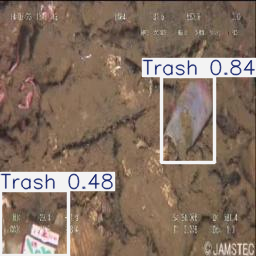


image 1/1 /kaggle/working/test/images/obj1617_frame0000017_jpg.rf.3359d71c1c63d603c478b56552ce86db.jpg: 640x640 2 Rovs, 1 Trash, 15.9ms
Speed: 3.8ms preprocess, 15.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


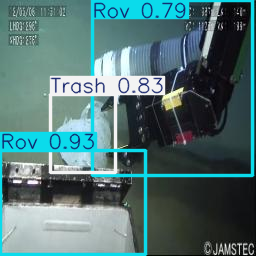


image 1/1 /kaggle/working/test/images/obj0865_frame0000053_jpg.rf.58692044ec6a8f7cf25fcc0dbcec8adc.jpg: 640x640 1 Bio, 1 Trash, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


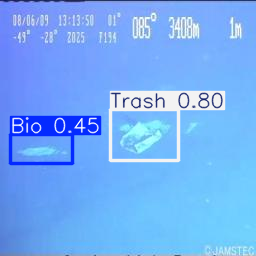


image 1/1 /kaggle/working/test/images/obj0348_frame0000044_jpg.rf.2ad9ebc48dead719e91aa8537ef5a36a.jpg: 640x640 1 Trash, 17.4ms
Speed: 3.9ms preprocess, 17.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


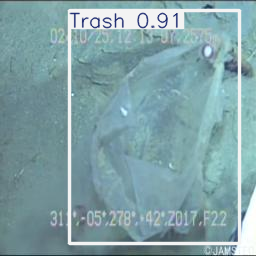


image 1/1 /kaggle/working/test/images/frame_00330_png_jpg.rf.1e8e91db999723e89aff25add36f3f76.jpg: 640x640 1 Trash, 17.7ms
Speed: 7.0ms preprocess, 17.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


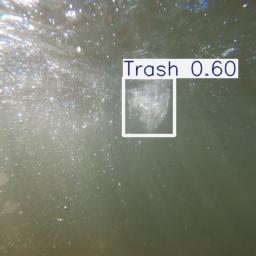


image 1/1 /kaggle/working/test/images/obj0317_frame0000064_jpg.rf.13b5a78f360121f448d5363982746ea1.jpg: 640x640 1 Trash, 14.5ms
Speed: 4.0ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


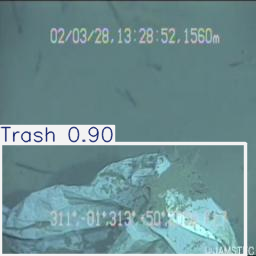


image 1/1 /kaggle/working/test/images/bio0002_frame0000600_jpg.rf.cb61b953d81cf800e1e970ca956c3411.jpg: 640x640 1 Bio, 21.0ms
Speed: 3.6ms preprocess, 21.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


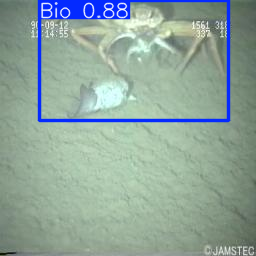


image 1/1 /kaggle/working/test/images/vid_000304_frame0000020_jpg.rf.683598fe5e4521d1b81148aea4a5558d.jpg: 640x640 1 Trash, 13.5ms
Speed: 5.3ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


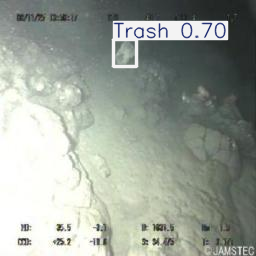


image 1/1 /kaggle/working/test/images/frame_00090_png_jpg.rf.fd4307c7cf8afca4abf52bd04f42c28e.jpg: 640x640 1 Trash, 19.6ms
Speed: 5.4ms preprocess, 19.6ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


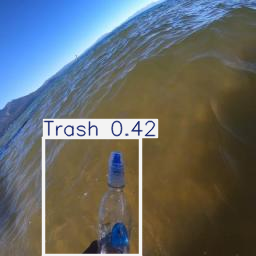


image 1/1 /kaggle/working/test/images/vid_000162_frame0000037_jpg.rf.3de6e95fb35b317a1724694a32f0d43a.jpg: 640x640 1 Trash, 18.0ms
Speed: 7.6ms preprocess, 18.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)


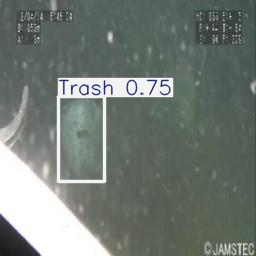


image 1/1 /kaggle/working/test/images/obj1617_frame0000011_jpg.rf.503c9af62717ebe6f57665ff16f92021.jpg: 640x640 2 Rovs, 1 Trash, 19.2ms
Speed: 3.6ms preprocess, 19.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


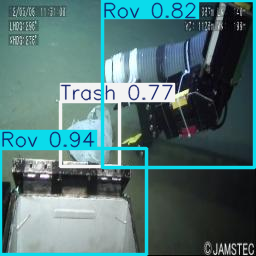


image 1/1 /kaggle/working/test/images/obj0348_frame0000020_jpg.rf.498c95d2eda5b3f2999490f4a2fd91db.jpg: 640x640 1 Trash, 15.3ms
Speed: 6.1ms preprocess, 15.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


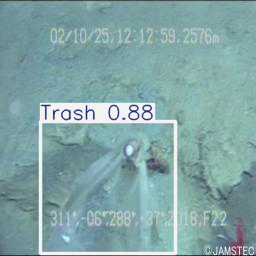


image 1/1 /kaggle/working/test/images/obj1051_frame0000009_jpg.rf.dbed0faa3f16472888aa8ee26ad297c6.jpg: 640x640 2 Rovs, 4 Trashs, 13.6ms
Speed: 3.8ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


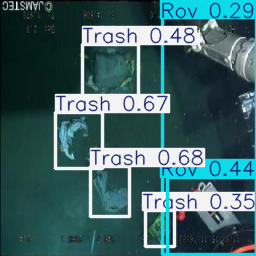


image 1/1 /kaggle/working/test/images/obj1654_frame0000313_jpg.rf.4d01408788df4209c9ebe84ab72fad13.jpg: 640x640 1 Rov, 1 Trash, 12.5ms
Speed: 3.9ms preprocess, 12.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


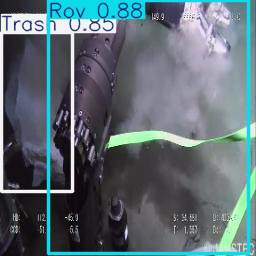


image 1/1 /kaggle/working/test/images/obj1505_frame0000238_jpg.rf.43efe3a99c0c1ee8a701648979d91cd3.jpg: 640x640 1 Trash, 12.2ms
Speed: 6.9ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


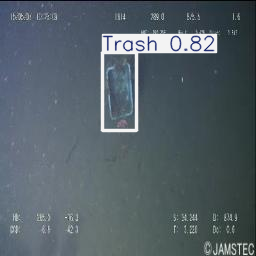


image 1/1 /kaggle/working/test/images/obj0212_frame0000034_jpg.rf.3f1513496567f7cb4cb3c2682712fdb1.jpg: 640x640 1 Trash, 13.0ms
Speed: 4.4ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


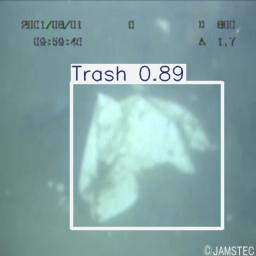


image 1/1 /kaggle/working/test/images/frame_00700_png_jpg.rf.e7cec18281c0a4051048e55b0e9fe413.jpg: 640x640 1 Trash, 13.4ms
Speed: 3.8ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


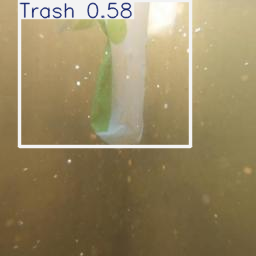


image 1/1 /kaggle/working/test/images/vid_000080_frame0000034_jpg.rf.858d4ef0b523e600aa40417ad5702d33.jpg: 640x640 1 Trash, 12.4ms
Speed: 3.6ms preprocess, 12.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


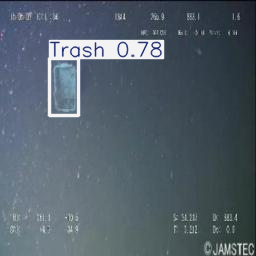


image 1/1 /kaggle/working/test/images/obj0236_frame0000049_jpg.rf.af22ca5a74fa36535a728c0170e6874a.jpg: 640x640 1 Trash, 12.7ms
Speed: 3.0ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


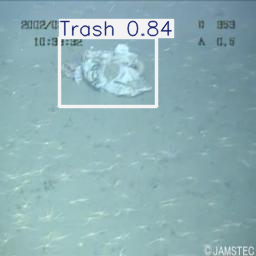


image 1/1 /kaggle/working/test/images/frame_01215_png_jpg.rf.bc1aa6dd51f16ba726850aa5d893f86e.jpg: 640x640 1 Trash, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


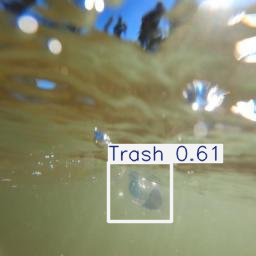


image 1/1 /kaggle/working/test/images/obj1024_frame0000141_jpg.rf.1b3dcb719688318e45a2bdae1d4fb1e8.jpg: 640x640 1 Trash, 13.8ms
Speed: 3.8ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


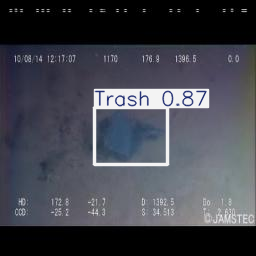


image 1/1 /kaggle/working/test/images/frame_01755_png_jpg.rf.6be669b126d4721d8fd541e237adc44e.jpg: 640x640 1 Trash, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


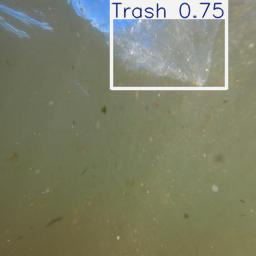


image 1/1 /kaggle/working/test/images/frame_00125_png_jpg.rf.47dceee04bb27cdb8f364a8a58f3b117.jpg: 640x640 1 Trash, 12.5ms
Speed: 4.4ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


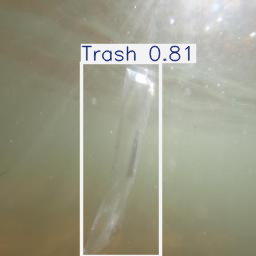


image 1/1 /kaggle/working/test/images/obj1603_frame0000039_jpg.rf.a8bf04c25815fab316c9de7337f6c5fb.jpg: 640x640 1 Rov, 1 Trash, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


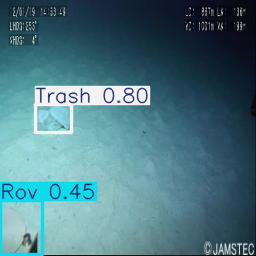


image 1/1 /kaggle/working/test/images/obj0002_frame0000067_jpg.rf.f4708f1f96d0bde7308239cd488db167.jpg: 640x640 1 Trash, 12.5ms
Speed: 3.6ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


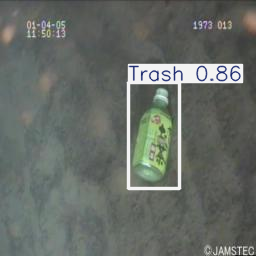


image 1/1 /kaggle/working/test/images/vid_000309_frame0000032_jpg.rf.4565d1ac4be33aa333f05bc32ef231e6.jpg: 640x640 1 Trash, 13.7ms
Speed: 3.3ms preprocess, 13.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


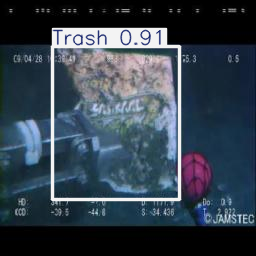


image 1/1 /kaggle/working/test/images/bio0000_frame0000123_jpg.rf.3dea7840c9faf75df3d82be47aad1a44.jpg: 640x640 1 Bio, 13.0ms
Speed: 3.5ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


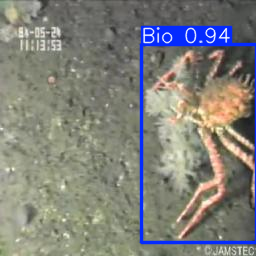


image 1/1 /kaggle/working/test/images/bio0002_frame0000471_jpg.rf.0f75b19e16538f49ae6de15ecd3a0708.jpg: 640x640 1 Bio, 14.2ms
Speed: 3.6ms preprocess, 14.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


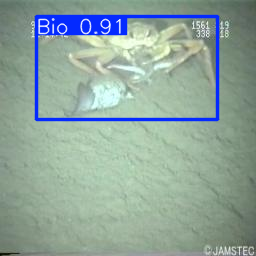


image 1/1 /kaggle/working/test/images/frame_00825_png_jpg.rf.f0562b17d5875bef98252d1a7c885dda.jpg: 640x640 1 Trash, 20.1ms
Speed: 3.9ms preprocess, 20.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


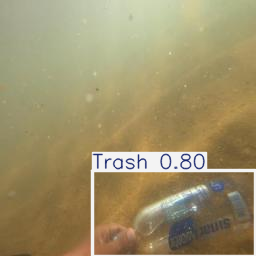


image 1/1 /kaggle/working/test/images/bio0013_frame0000146_jpg.rf.19906b0c04931d1c8d96238c34825398.jpg: 640x640 1 Bio, 1 Rov, 16.7ms
Speed: 4.5ms preprocess, 16.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


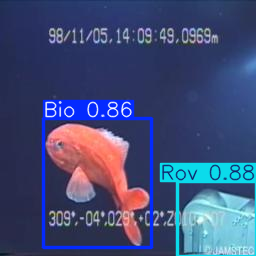


image 1/1 /kaggle/working/test/images/obj0014_frame0000031_jpg.rf.4b0b35d6aaae43672ac3be9e877cbc8b.jpg: 640x640 1 Trash, 20.7ms
Speed: 4.9ms preprocess, 20.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


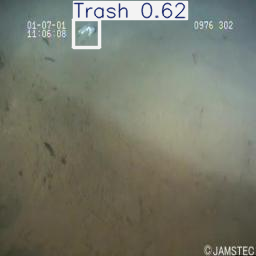


image 1/1 /kaggle/working/test/images/vid_000045_frame0000039_jpg.rf.e06dd4aa2483543bf06212ed67993b05.jpg: 640x640 1 Trash, 20.6ms
Speed: 4.6ms preprocess, 20.6ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


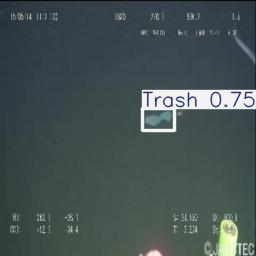


image 1/1 /kaggle/working/test/images/obj1664_frame0000149_jpg.rf.5777666266c15fdf6e501e8a15c78807.jpg: 640x640 1 Trash, 16.7ms
Speed: 4.0ms preprocess, 16.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


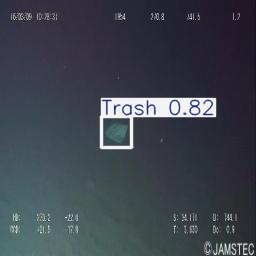


image 1/1 /kaggle/working/test/images/obj0248_frame0000059_jpg.rf.0796831c2b0dba4b301937b4bf8fc7a0.jpg: 640x640 1 Trash, 19.7ms
Speed: 4.3ms preprocess, 19.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


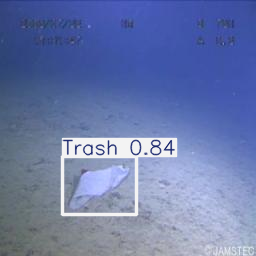


image 1/1 /kaggle/working/test/images/obj0854_frame0000014_jpg.rf.d09c9f92b58f1e7080352f8b431b5812.jpg: 640x640 1 Trash, 11.7ms
Speed: 6.0ms preprocess, 11.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


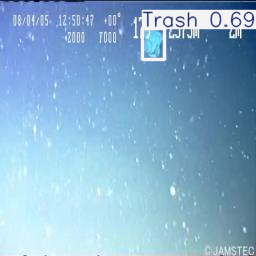


image 1/1 /kaggle/working/test/images/obj1648_frame0000171_jpg.rf.d50e2761060b42b3e7d039d86553668a.jpg: 640x640 1 Rov, 12.0ms
Speed: 6.3ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


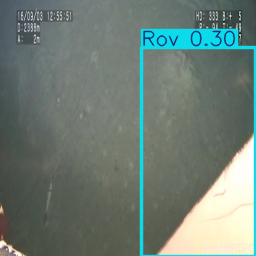


image 1/1 /kaggle/working/test/images/obj1656_frame0000027_jpg.rf.cae00264ad022b52054539d666b35b1b.jpg: 640x640 1 Rov, 1 Trash, 11.7ms
Speed: 5.7ms preprocess, 11.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


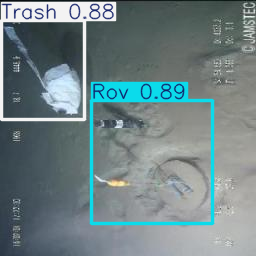


image 1/1 /kaggle/working/test/images/obj1654_frame0000321_jpg.rf.5f05adbd836af211b6311ff81fbd8c82.jpg: 640x640 1 Rov, 1 Trash, 14.6ms
Speed: 3.7ms preprocess, 14.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


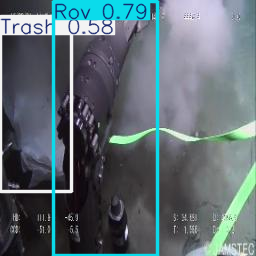


image 1/1 /kaggle/working/test/images/frame_00885_png_jpg.rf.d51c3374e93776f438c693eeb0a6b4f8.jpg: 640x640 1 Trash, 13.5ms
Speed: 3.6ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


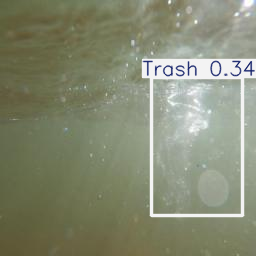


image 1/1 /kaggle/working/test/images/bio0000_frame0000123_jpg.rf.386ba657ad697663265b358bf345cc69.jpg: 640x640 1 Bio, 12.2ms
Speed: 3.4ms preprocess, 12.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


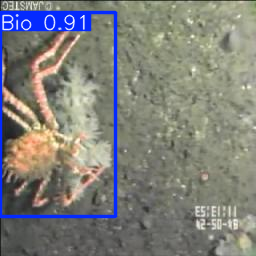


image 1/1 /kaggle/working/test/images/obj0749_frame0000090_jpg.rf.3b82f88bcec157c47480516761c02630.jpg: 640x640 1 Rov, 1 Trash, 12.7ms
Speed: 3.4ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


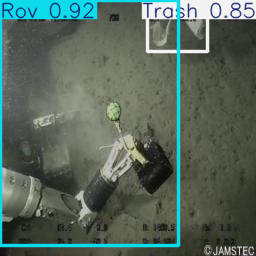


image 1/1 /kaggle/working/test/images/obj0753_frame0000153_jpg.rf.fa64a0678266d45b8c34657f82bec5e9.jpg: 640x640 1 Bio, 1 Rov, 1 Trash, 13.3ms
Speed: 3.5ms preprocess, 13.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


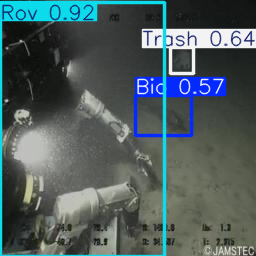


image 1/1 /kaggle/working/test/images/obj1218_frame0000078_jpg.rf.11b152f00fdcb93cd29711ee642b9775.jpg: 640x640 1 Rov, 1 Trash, 11.9ms
Speed: 5.9ms preprocess, 11.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


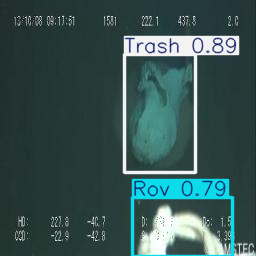


image 1/1 /kaggle/working/test/images/obj1073_frame0000030_jpg.rf.1b4b313e0a9442283be3d8ab49148883.jpg: 640x640 1 Bio, 1 Rov, 1 Trash, 13.5ms
Speed: 3.3ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


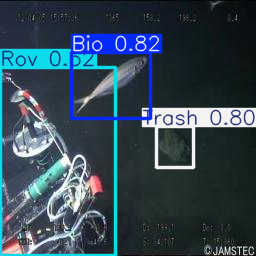


image 1/1 /kaggle/working/test/images/obj0007_frame0000026_jpg.rf.d151bd851c727f0988609fd5b5fb4577.jpg: 640x640 1 Trash, 13.1ms
Speed: 3.2ms preprocess, 13.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


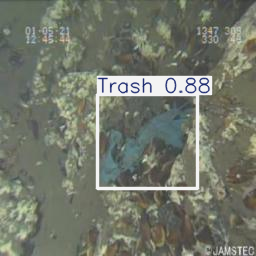


image 1/1 /kaggle/working/test/images/obj1602_frame0000083_jpg.rf.d0329e81977ac28ff3f7bb56caf2954b.jpg: 640x640 1 Trash, 13.3ms
Speed: 3.6ms preprocess, 13.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


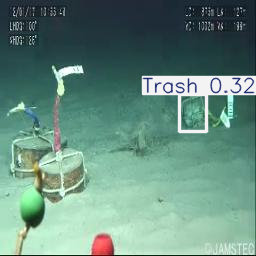


image 1/1 /kaggle/working/test/images/obj0747_frame0000063_jpg.rf.7a065e80c283c8e8b25f22f38b368cf9.jpg: 640x640 1 Trash, 19.3ms
Speed: 3.3ms preprocess, 19.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


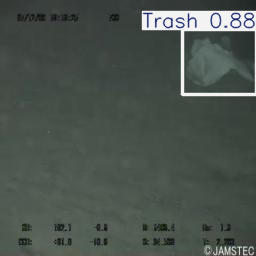


image 1/1 /kaggle/working/test/images/vid_000241_frame0000010_jpg.rf.b327c9a18b2b3c72ec9944f3ecfd1647.jpg: 640x640 1 Trash, 13.4ms
Speed: 3.7ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


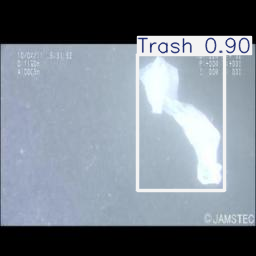


image 1/1 /kaggle/working/test/images/obj0348_frame0000015_jpg.rf.babe2cb207ec35ceaab434f3d4ae5401.jpg: 640x640 1 Rov, 1 Trash, 13.4ms
Speed: 3.6ms preprocess, 13.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


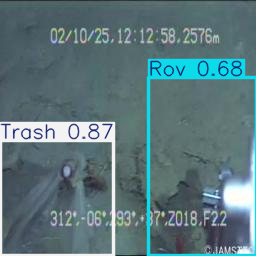


image 1/1 /kaggle/working/test/images/frame_00810_png_jpg.rf.cee44396332d7863fed5a1ea0a8ca019.jpg: 640x640 1 Trash, 14.0ms
Speed: 3.9ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


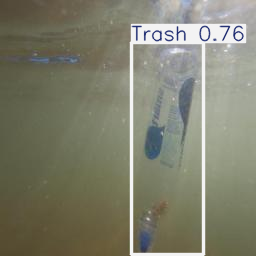


image 1/1 /kaggle/working/test/images/obj0301_frame0000056_jpg.rf.691dca70cd097878db521be44251b974.jpg: 640x640 1 Rov, 1 Trash, 12.9ms
Speed: 3.8ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


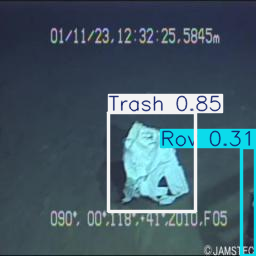


image 1/1 /kaggle/working/test/images/bio0002_frame0000238_jpg.rf.e6f817bad1ee2e49d6d02f5f873b4a79.jpg: 640x640 1 Bio, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


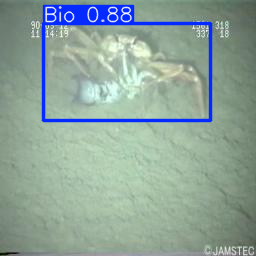


image 1/1 /kaggle/working/test/images/obj1251_frame0000015_jpg.rf.d5ef3f93bfbc8c839f21c602788c3796.jpg: 640x640 1 Bio, 1 Trash, 12.9ms
Speed: 3.8ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


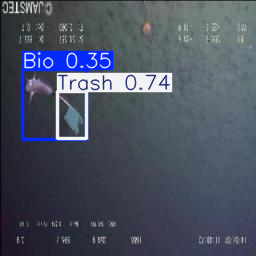


image 1/1 /kaggle/working/test/images/obj0343_frame0000034_jpg.rf.87069326367695518c18eb24c79ec5f5.jpg: 640x640 1 Trash, 12.7ms
Speed: 3.8ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


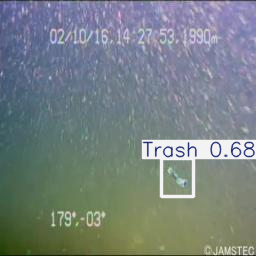


image 1/1 /kaggle/working/test/images/vid_000255_frame0000077_jpg.rf.4e33a4177520a51fe9cfa2c4fa6431a8.jpg: 640x640 1 Trash, 21.6ms
Speed: 6.4ms preprocess, 21.6ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


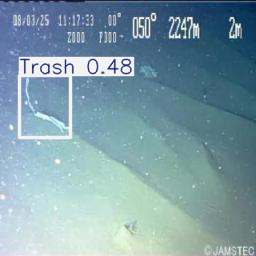


image 1/1 /kaggle/working/test/images/frame_01620_png_jpg.rf.2057003684202645d67383f93fac73a1.jpg: 640x640 1 Trash, 16.2ms
Speed: 3.8ms preprocess, 16.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


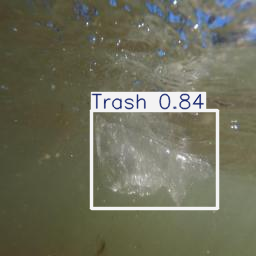


image 1/1 /kaggle/working/test/images/bio0002_frame0000420_jpg.rf.d8b09eb66906a4c0a8f0eac8a7c1af11.jpg: 640x640 1 Bio, 15.5ms
Speed: 4.0ms preprocess, 15.5ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


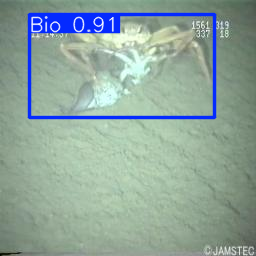


image 1/1 /kaggle/working/test/images/obj0236_frame0000046_jpg.rf.fdacc2f316527a06b615357547f8b398.jpg: 640x640 1 Trash, 15.2ms
Speed: 7.2ms preprocess, 15.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


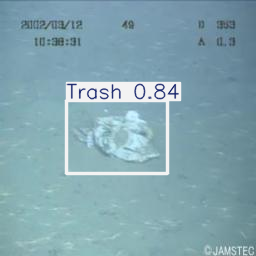


image 1/1 /kaggle/working/test/images/obj0332_frame0000080_jpg.rf.29762ea528530acef3932c0ba706e7d4.jpg: 640x640 3 Trashs, 15.9ms
Speed: 4.4ms preprocess, 15.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


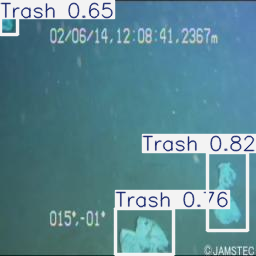


image 1/1 /kaggle/working/test/images/bio0016_frame0000329_jpg.rf.e6b6bfc4d0e50238a847ba250b707d62.jpg: 640x640 2 Bios, 12.6ms
Speed: 4.0ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


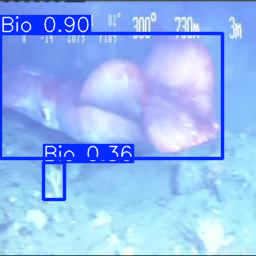


image 1/1 /kaggle/working/test/images/frame_00720_png_jpg.rf.097400fc66506f7051b537a25a1d5376.jpg: 640x640 1 Trash, 13.0ms
Speed: 3.3ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


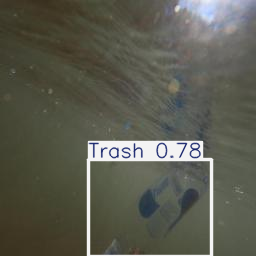

In [16]:
import os
images = os.listdir("/kaggle/working/test/images")
for i in range(120):
    image = os.path.join("/kaggle/working/test/images/", images[i])
    result_predict = Valid_model.predict(source = image, imgsz=(640), iou=0.4)

    # show results
    plot = result_predict[0].plot()
    plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(plot))